In [1]:
from rhythm_can.constants import *
from rhythm_can.utils import *
%matplotlib inline

print("DRUM_CLASSES:", DRUM_CLASSES)
print("# of drum instruments:", nb_notes)

print("dimentionality of random input z:", len_input)
print("resolution of one bar:", resolution*4) # how many grids in one bar
print("length of rhythm pattern to be generated:", len_seq, "beats" )


DRUM_CLASSES: ['Kick', 'Snare', 'Hi-hat closed', 'Hi-hat open', 'Low Tom', 'High Tom', 'Cymbal', 'Clap/Cowbell', 'Rim']
# of drum instruments: 9
dimentionality of random input z: 100
resolution of one bar: 16
length of rhythm pattern to be generated: 32 beats


# Play Training data (Human Made)

In [2]:
import numpy as np

matrices_onsets = np.load("./data/matrices_drum_gm_clean.npz")['onsets']
matrices_velos = np.load("./data/matrices_drum_gm_clean.npz")['velocities']
matrices_offsets = np.load("./data/matrices_drum_gm_clean.npz")['offsets']
matrices_genres = np.load("./data/matrices_drum_gm_clean.npz")['genre_ids']
matrices_drums = matrices_velos
GENRES           = np.load("./data/matrices_drum_gm_clean.npz")['genres']
NB_GENRES = len(GENRES)

print("Genres", GENRES)
print("# of Genres", NB_GENRES)
print(matrices_onsets.shape)

Genres ['breakbeat' 'dnb' 'downtempo' 'garage' 'house' 'jungle' 'old_skool'
 'techno' 'trance']
# of Genres 9
(16647, 32, 9)


breakbeat


/home/malcolm/Desktop/RhythmGAN_pytorch/rhythm_can/utils.py:40: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(["1.1","1.2","1.3","1.4","2.1","2.2","2.3","2.4"] )
/home/malcolm/Desktop/RhythmGAN_pytorch/rhythm_can/utils.py:41: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([""]+DRUM_CLASSES)


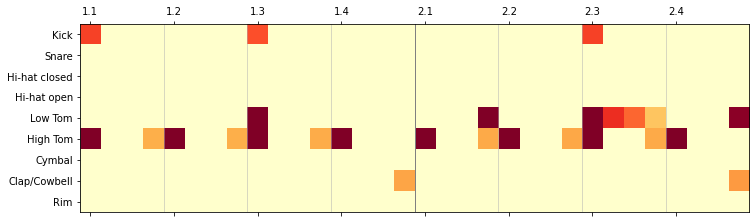

dnb


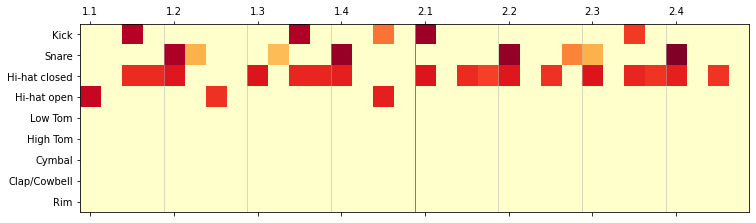

downtempo


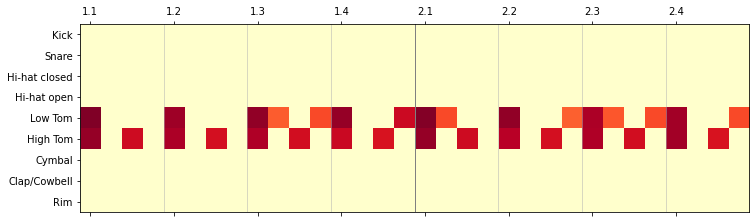

garage


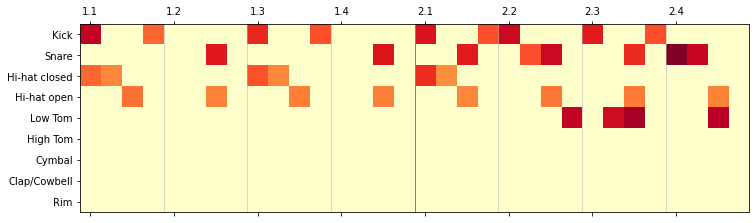

house


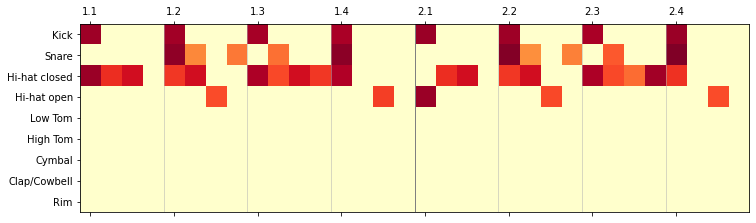

jungle


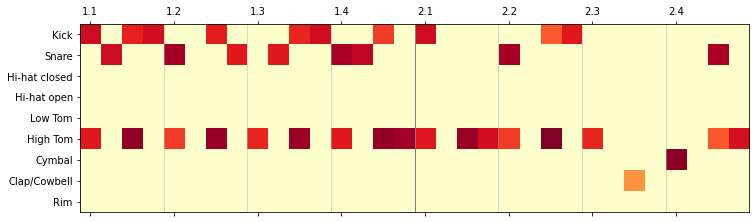

old_skool


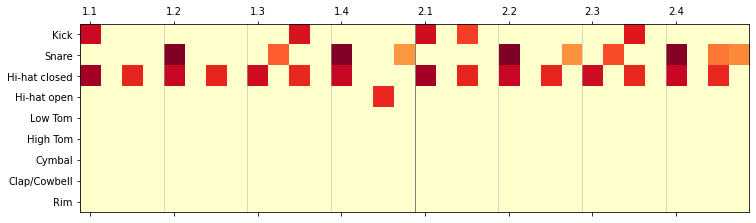

techno


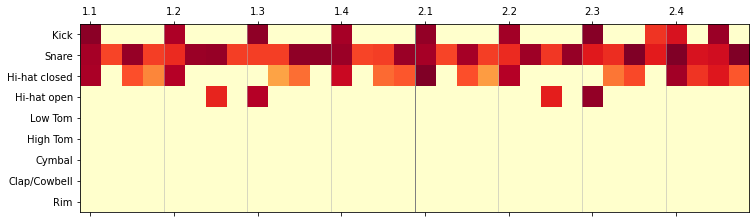

trance


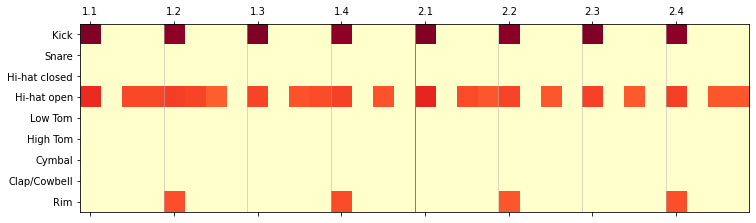

In [3]:
import random
for i in range(9):
    print(GENRES[i])
    temp = np.where(matrices_genres == i)[0]
    index = random.choice(temp)
    drum = matrices_drums[index]
    
    plot_drum_matrix(drum)
    play_drum_matrix(drum)
    

/home/malcolm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  """
/home/malcolm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  


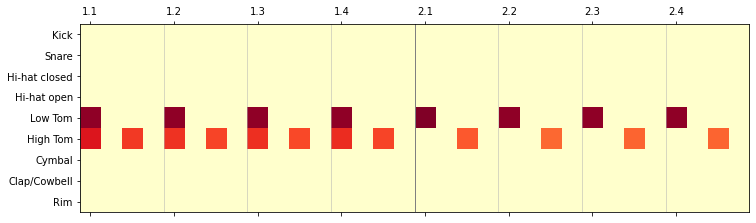

In [22]:
a = drum
a = np.transpose(np.squeeze(a))
fig = plt.figure(figsize=(12,5))
ax = fig.add_subplot(111)
ax.set_xticklabels(["1.1","1.2","1.3","1.4","2.1","2.2","2.3","2.4"] )
ax.set_yticklabels([""]+DRUM_CLASSES)
for i in range(8):
    plt.axvline(x=i*4-0.5,  color='0.7', linewidth=0.5)
plt.axvline(x=15.5, color='0.5', linewidth=1.0)

ax.matshow(a, cmap="YlOrRd")
plt.xticks(np.arange(0, 32, 4.0))
signature = {'epoch':0,'genre':'trance'}
plt.savefig('./img/%depoch_%s.png'%(signature['epoch'],signature['genre']))

plt.show() 


# Test Generator (Let AI make music)

#### Load pretrained


In [13]:
import torch
import os

In [14]:
pretrained_model_path = os.path.join('ckpt/conditioned_gan/saves/d_loss0.3968_g_loss2.1787_Epoch300.pth')
package = torch.load(pretrained_model_path)

In [15]:
from collections import OrderedDict
def convert_state_dict(state_dict):
    if not next(iter(state_dict)).startswith("module."):
        return state_dict  # abort if dict is not a DataParallel model_state
    new_state_dict = OrderedDict()
    for k, v in state_dict.items():
        name = k[7:]  # remove `module.`
        new_state_dict[name] = v
    return new_state_dict

In [16]:
package['num_gpu']

2

In [17]:
generator_dataparallel = package['generator']
generator_state_dict = convert_state_dict(generator_dataparallel)  

In [18]:
import importlib

MODEL = importlib.import_module("ckpt.conditioned_gan.model")
generator,discriminator = MODEL.get_model(NB_GENRES = NB_GENRES,
                                            len_input= len_input,
                                            len_seq= len_seq,
                                            nb_notes=nb_notes)

In [19]:
generator.load_state_dict(generator_state_dict)

<All keys matched successfully>

#### Generating rhythm

breakbeat


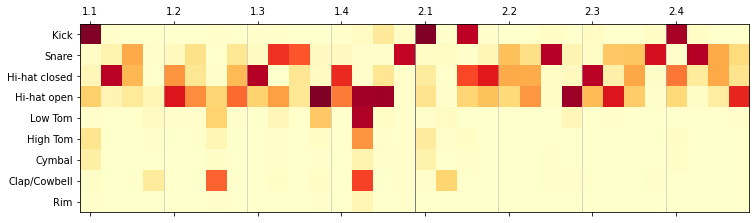

dnb


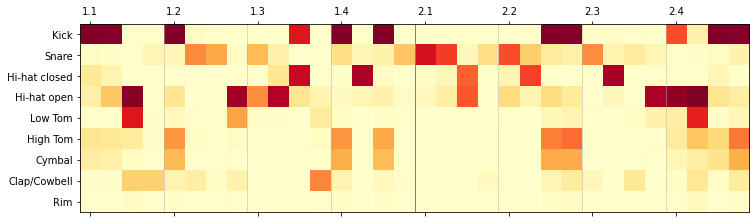

downtempo


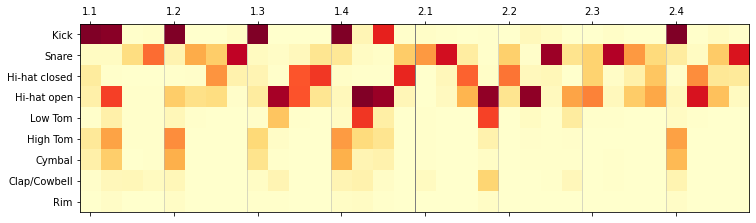

garage


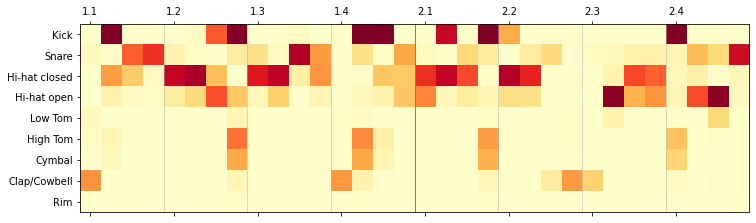

house


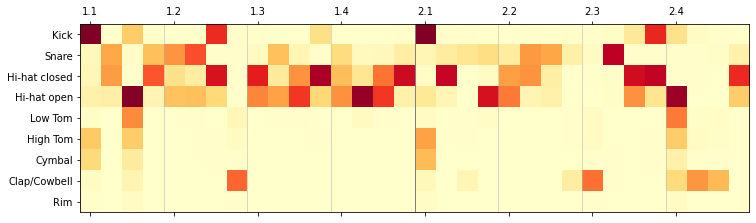

jungle


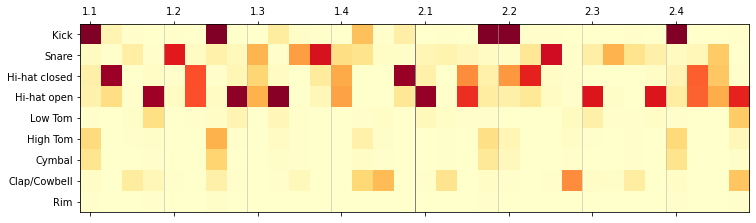

old_skool


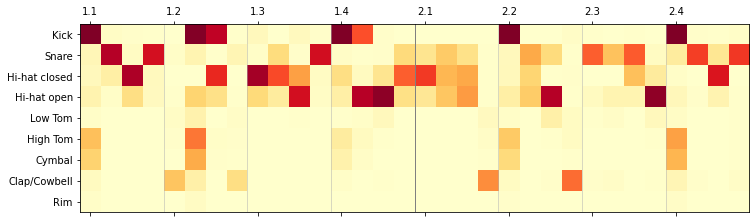

techno


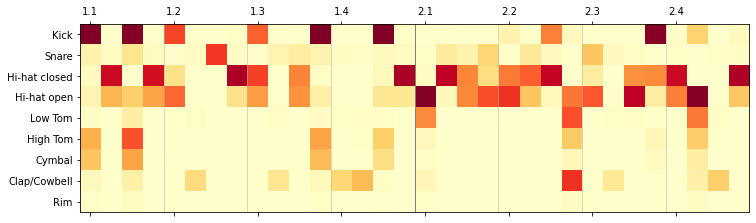

trance


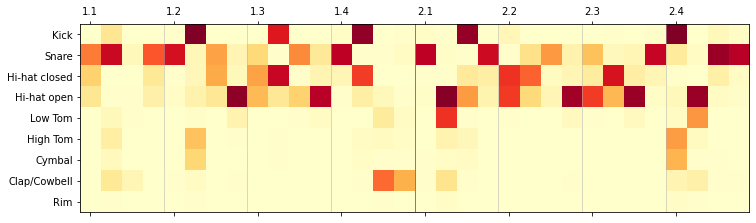

In [20]:
generator.eval()
for i in range(9):
    print(GENRES[i])
    #The model need generate at least 2 batches
    noise = np.random.normal(0.0, 0.50, size=(200)).reshape(2,100)

    noise = torch.FloatTensor(noise)
    label = torch.LongTensor([i,i])

    drum_fake = generator(noise,label)
    drum1 = drum_fake[0].data.numpy()
    drum2 = drum_fake[1].data.numpy()
    
    plot_drum_matrix(drum1)
    play_drum_matrix(drum1)